# GG4527- Urban Analytics: A Toolkit for Sustainable Urban Development Assignment 1
## Lab 4: Python Recap
-----

### Challenge 1

### Challenge 2

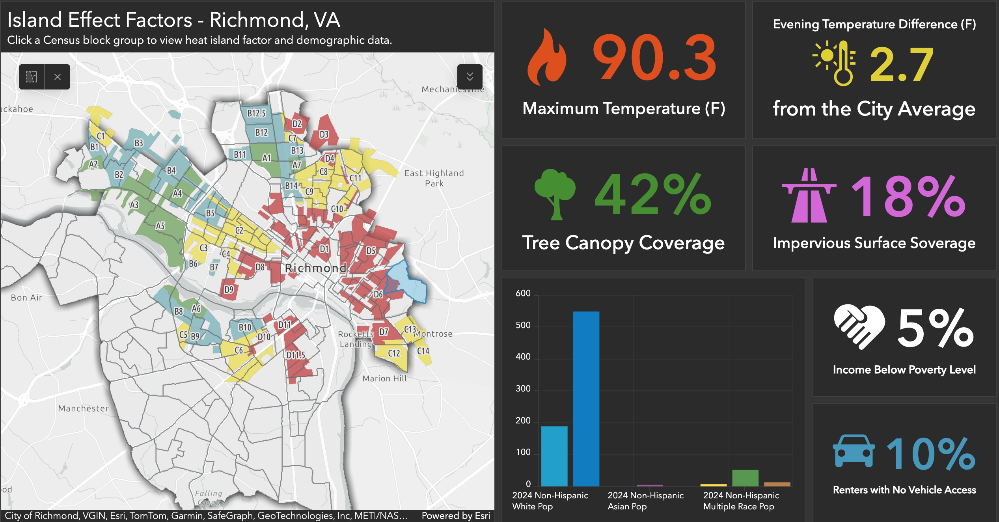

In [76]:
# Screenshot of dashboard

from IPython.display import Image

Image(filename='Lab_4/ss/dash.png')

Link to dashboard:

https://www.arcgis.com/apps/dashboards/10f3560ade514e62b49f7b2a0937a082


### Challenge 3

In [99]:
import geopandas as gpd

scotland_sf = gpd.read_file("Lab_4/data_lab_4/SG_SIMD_2020.shp")
#this reads the shape file in which we can extract the data for Edinburgh


In [ ]:
scotland_sf.head() # this tells us that the "LAName" column will indicate areas are for Edinburgh

In [ ]:
print(scotland_sf["LAName"].value_counts()) 

# this shows all of the area names the one of interest is "City of Edinburgh"
# it also tells us the there is 597 rows
# this is the information we need to extract in order to create maps

In [107]:
edi_sf= scotland_sf[scotland_sf["LAName"] == "City of Edinburgh"] # extracting wanted data


edi_sf.head() # shows the wanted data


,DataZone,DZName,LAName,SAPE2017,WAPE2017,Rankv2,Quintilev2,Decilev2,Vigintilv2,Percentv2,...,CrimeRate,CrimeRank,HouseNumOC,HouseNumNC,HouseOCrat,HouseNCrat,HouseRank,Shape_Leng,Shape_Area,geometry
1911,S01008417,Balerno and Bonnington Village - 01,City of Edinburgh,708,397,5537,4,8,16,80,...,86,5392.0,17,8,2%,1%,6350.0,20191.721420,1.029993e+07,"POLYGON ((315157.369 666212.846, 315173.727 66..."
1912,S01008418,Balerno and Bonnington Village - 02,City of Edinburgh,691,378,6119,5,9,18,88,...,103,5063.0,7,10,1%,1%,6650.0,25944.861787,2.357050e+07,"POLYGON ((317816.000 666579.000, 318243.000 66..."
1913,S01008419,Balerno and Bonnington Village - 03,City of Edinburgh,541,338,5200,4,8,15,75,...,187,3594.0,30,0,6%,0%,5372.5,5738.935106,1.366457e+06,"POLYGON ((316831.000 667049.000, 316816.000 66..."
1914,S01008420,Balerno and Bonnington Village - 04,City of Edinburgh,466,274,6431,5,10,19,93,...,109,4957.0,2,0,0%,0%,6957.0,1890.096713,1.051967e+05,"POLYGON ((316368.000 666124.000, 316379.297 66..."
1915,S01008421,Balerno and Bonnington Village - 05,City of Edinburgh,884,537,3441,3,5,10,50,...,264,2575.0,61,6,7%,1%,4598.0,2645.609037,1.465441e+05,"POLYGON ((316411.427 666596.771, 316422.940 66..."


In [ ]:
import geopandas as gpd
basic_edi = edi_sf.explore()
basic_edi

#creating a basic map to ensure the correct data has been extracted

In [ ]:
import matplotlib.pyplot as plt
import mapclassify


fig, ax = plt.subplots(figsize=(8, 6)) #setting ax values

classifier_nb = mapclassify.NaturalBreaks(edi_sf['CrimeRate'], k=5) #setting natural breaks intervals

# I have set this as classifier_nb to ensure there is no mix up between the two maps and indicate 
# the position the maps when viewed together


edi_sf.plot(column='CrimeRate', ax=ax,
         legend=True, cmap='viridis',
         scheme='UserDefined',
         classification_kwds={'bins': classifier_nb.bins} 
        )
plt.title("Choropleth Map of Ediburgh Showing Crime Rates using Natural Breaks") #setting title 
plt.show()

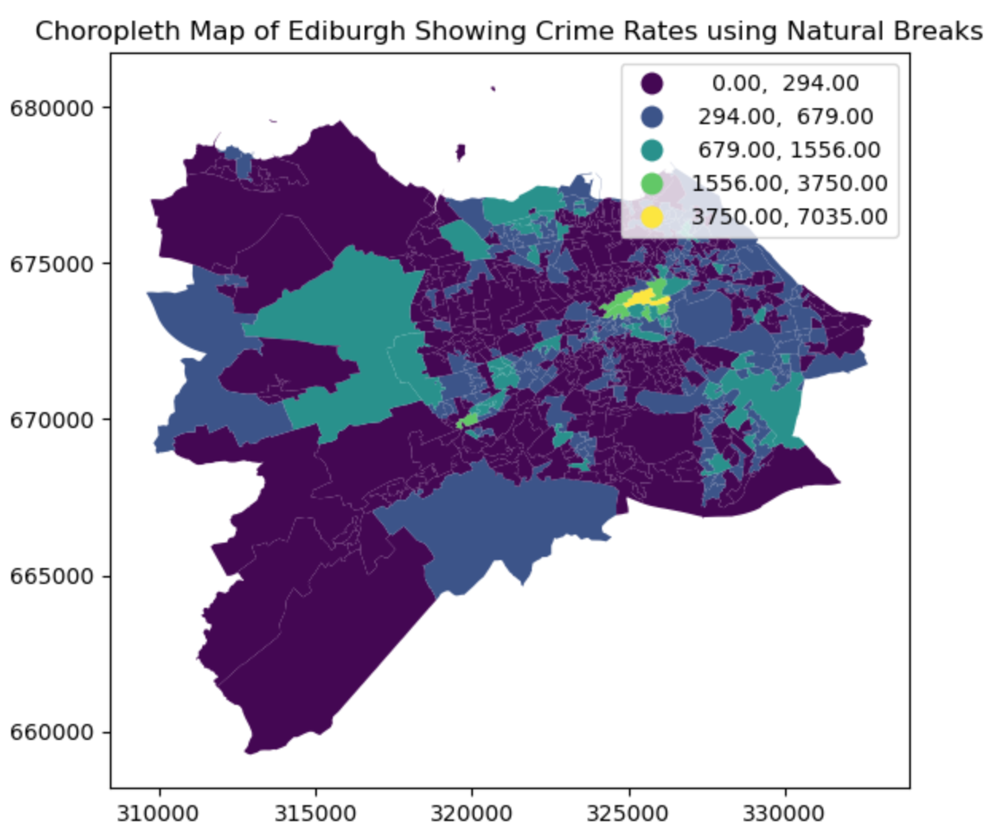

In [72]:
# Screenshot of results

from IPython.display import Image

Image(filename='Lab_4/ss/edi_nb.png')


In [ ]:
import matplotlib.pyplot as plt
import mapclassify


fig, ax = plt.subplots(figsize=(8, 6)) #setting ax values for size of map

classifier_ei = mapclassify.EqualInterval(edi_sf['CrimeRate'], k=5) #setting equal intervals

# again, ensuring the classifier name is different to the last map i.e classifier_ei this time

edi_sf.plot(column='CrimeRate', ax=ax,
         legend=True, cmap='viridis',
         scheme='UserDefined',
         classification_kwds={'bins': classifier_ei.bins} 
        )
plt.title("Choropleth Map of Ediburgh Showing Crime Rates using Equal Intervals") # setting title
plt.show()

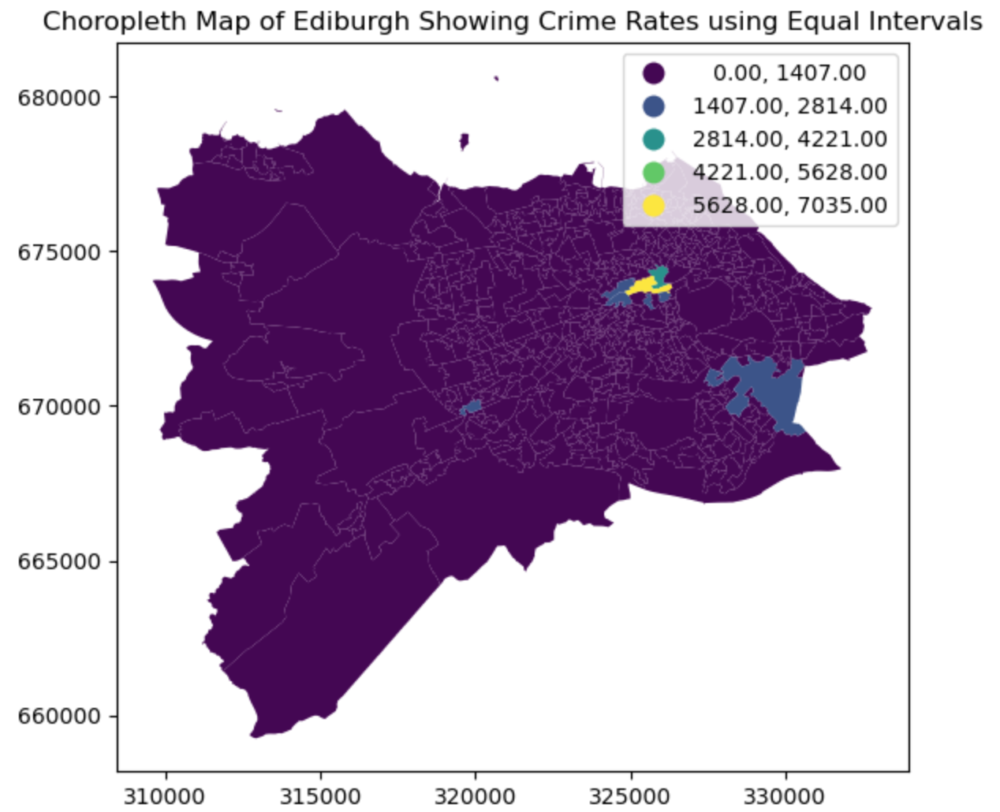

In [73]:
# screenshot of results

from IPython.display import Image

Image(filename='Lab_4/ss/edi_ei.png')

In [ ]:
import matplotlib.pyplot as plt
import mapclassify

fig, axs = plt.subplots(1, 2, figsize=(18, 8)) # setting up environment to view maps side by side


edi_sf.plot(column='CrimeRate', ax=axs[0],
         legend=True, cmap='viridis',
         scheme='UserDefined',
         classification_kwds={'bins': classifier_nb.bins} #using classifier_nb for first map
        )
axs[0].set_title("Choropleth Map of Ediburgh Showing Crime Rates using Natural Breaks")

edi_sf.plot(column='CrimeRate', ax=axs[1],
         legend=True, cmap='viridis',
         scheme='UserDefined',
         classification_kwds={'bins': classifier_ei.bins} #using classifier_ei for second map
        )
axs[1].set_title("Choropleth Map of Ediburgh Showing Crime Rates using Equal Intervals")

plt.tight_layout() 
plt.show()


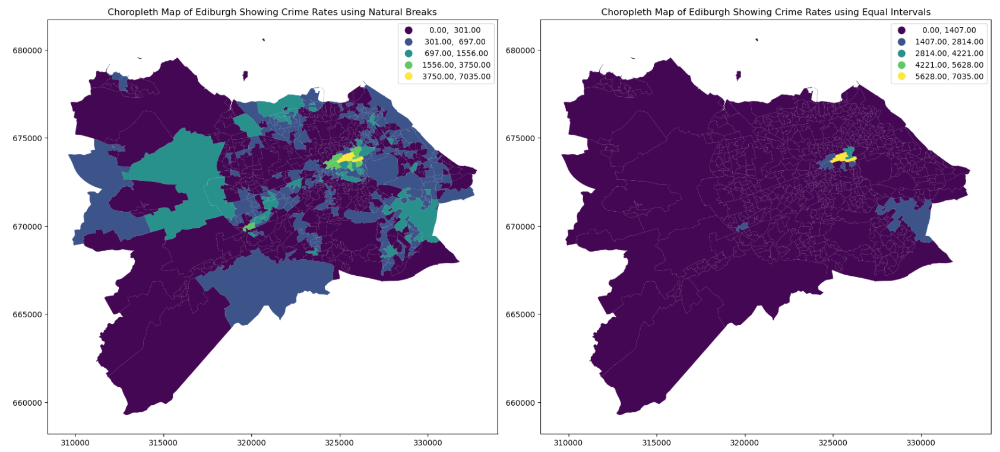

In [74]:
# Screenshot of results

from IPython.display import Image

Image(filename='Lab_4/ss/edi_both.png')

In [ ]:
#for plotting histograms to compare breaks in the data

fig, axes = plt.subplots(1, 2, figsize=(15, 5)) # setting up environment to view histograms side by side


sns.histplot(data=edi_sf, x="CrimeRate", ax=axes[0], kde=True, bins=20)
axes[0].axvline(classifier_nb.bins[0], color='red', linestyle='dashed', linewidth=2, label='Natural Breaks')
for bin_value in classifier_nb.bins:
    axes[0].axvline(bin_value, color='red', linestyle='dashed', linewidth=2) # ensuring to use classifer_nb
axes[0].set_title("Crime Rate Histogram with Natural Breaks")
axes[0].legend()


sns.histplot(data=edi_sf, x="CrimeRate", ax=axes[1], kde=True, bins=20)
axes[1].axvline(classifier_ei.bins[0], color='blue', linestyle='dashed', linewidth=2, label='Equal Intervals')
for bin_value in classifier_ei.bins:
    axes[1].axvline(bin_value, color='blue', linestyle='dashed', linewidth=2) # ensuring to use classifier_ei
axes[1].set_title("Crime Rate Histogram with Equal Intervals")
axes[1].legend()

# 4. Adjust the plot.
plt.tight_layout()
plt.show()

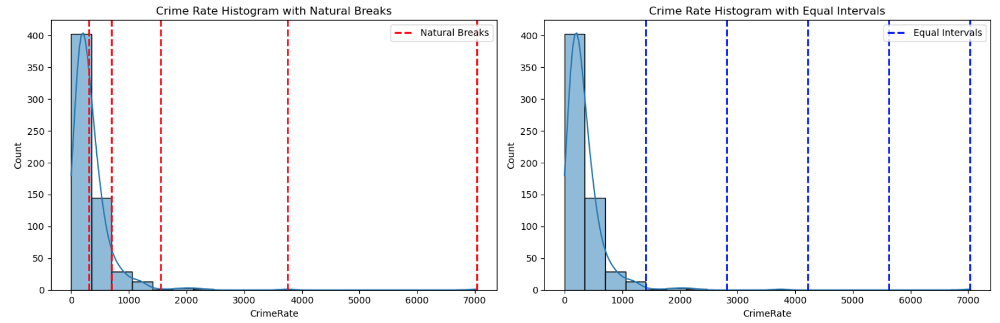

In [75]:
#Screenshot of results

from IPython.display import Image

Image(filename='Lab_4/ss/edi_histo.png')

In [183]:
# creating maps to compare Glasgow and Edinburgh deprivation

# Edinburgh first
num_classes = 5
classifier_nb = mc.NaturalBreaks(edi_sf['CrimeCount'], k=num_classes)  
edi_sf['classification_nb'] = classifier_nb.yb 

print(classifier_nb)
print(edi_sf[['CrimeCount', 'classification_nb']]) # using number of no qualifications as a measure of deprivation

# classification looks good so can create interactive map

NaturalBreaks

    Interval       Count
------------------------
[  0.00,  22.00] |   331
( 22.00,  50.00] |   194
( 50.00, 125.00] |    61
(125.00, 328.00] |    10
(328.00, 608.00] |     1
      CrimeCount  classification_nb
1911           6                  0
1912           7                  0
1913          10                  0
1914           5                  0
1915          23                  1
...          ...                ...
2503          25                  1
2504           6                  0
2505           4                  0
2506           6                  0
2507           6                  0

[597 rows x 2 columns]


In [185]:
import plotly.express as px

edi_dep = px.choropleth_mapbox(edi_sf,
                           geojson=edi_sf.geometry,
                           locations=edi_sf.index,
                           color="classification_nb",
                           color_continuous_scale="viridis",
                           range_color= (0, 5),
                           opacity=0.5,
                           center={"lat": 55.9533, "lon": -3.1883},
                           mapbox_style="carto-positron",
                           zoom=9.5)
edi_dep.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
edi_dep.show()

/var/folders/3y/r3wpbyvn1yl64h2tftjldyf40000gn/T/ipykernel_44131/3628443417.py:3: DeprecationWarning:

*choropleth_mapbox* is deprecated! Use *choropleth_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

